In [ ]:
import numpy as np
%pip install ultralytics
%pip install fiftyone
import ultralytics
ultralytics.checks()

import fiftyone as fo
import fiftyone.zoo as foz

import shutil

from ultralytics import YOLO

import cv2
import torch
from PIL import Image
from google.colab.patches import cv2_imshow

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.9/78.2 GB disk)


Migrating database to v0.21.0


INFO:fiftyone.migrations.runner:Migrating database to v0.21.0


In [ ]:
!pip install numba

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from numba import cuda
device = cuda.get_current_device() 
# device.reset()

In [ ]:
custom_cls = ["Clothing", "Tree", "Human face", "Footwear", "Window", 
            "Building", "Chair", "Fashion accessory", 
            "Food", "Glasses", "Sunglasses", "Vehicle", "Drink", "Animal"]
# https://learnopencv.com/fast-image-downloader-for-open-images-v4/

## Download dataset

In [ ]:
# custom_20_cls = ["Clothing", "Person", "Tree", "Human face", "Footwear", "Window", 
#             "Plant", "Building", "Chair", "Fashion accessory", 
#             "Food", "Glasses", "Vehicle", "Sports equipment",
#             "Book", "Drink", "Animal", "Door", "Airplane", "Mobile phone"]

In [ ]:
valid_dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["detections", "classifications"],
    classes = custom_cls,
    max_samples=1000,
    shuffle=True,
)

INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/validation/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/validation/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmph539f3ab/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/validation-annotations-human-imagelabels-boxable.csv' to '/root/fiftyone/open-images-v7/validation/labels/classifications.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/validation/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 1000 images


 100% |█████████████████| 1000/1000 [1.2m elapsed, 0s remaining, 12.4 files/s]      


INFO:eta.core.utils: 100% |█████████████████| 1000/1000 [1.2m elapsed, 0s remaining, 12.4 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |███████████████| 1000/1000 [23.2s elapsed, 0s remaining, 45.5 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1000/1000 [23.2s elapsed, 0s remaining, 45.5 samples/s]      


Dataset 'open-images-v7-validation-1000' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-validation-1000' created


In [ ]:
test_dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="test",
    label_types=["detections", "classifications"],
    classes = custom_cls,
    max_samples=1000,
    shuffle=True,
)

INFO:fiftyone.zoo.datasets:Downloading split 'test' to '/root/fiftyone/open-images-v7/test' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/test/test-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/test/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/test/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmpg_hl12a0/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/test-annotations-human-imagelabels-boxable.csv' to '/root/fiftyone/open-images-v7/test/labels/classifications.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/test/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 1000 images


 100% |█████████████████| 1000/1000 [1.2m elapsed, 0s remaining, 12.5 files/s]      


INFO:eta.core.utils: 100% |█████████████████| 1000/1000 [1.2m elapsed, 0s remaining, 12.5 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'test'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'test'


 100% |███████████████| 1000/1000 [18.8s elapsed, 0s remaining, 61.3 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1000/1000 [18.8s elapsed, 0s remaining, 61.3 samples/s]      


Dataset 'open-images-v7-test-1000' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-test-1000' created


In [ ]:
train_dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="train",
    label_types=["detections", "classifications"],
    classes = custom_cls,
    max_samples=15000,
    shuffle=True,
)

INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/open-images-v7/train' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv' to '/root/fiftyone/open-images-v7/train/metadata/image_ids.csv'


 100% |██████|    4.8Gb/4.8Gb [2.9s elapsed, 0s remaining, 1.6Gb/s]        


INFO:eta.core.utils: 100% |██████|    4.8Gb/4.8Gb [2.9s elapsed, 0s remaining, 1.6Gb/s]        


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/train/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmp3wdz8pz0/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/train-annotations-human-imagelabels-boxable.csv' to '/root/fiftyone/open-images-v7/train/labels/classifications.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/train/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 15000 images


 100% |███████████████| 15000/15000 [18.0m elapsed, 0s remaining, 14.0 files/s]      


INFO:eta.core.utils: 100% |███████████████| 15000/15000 [18.0m elapsed, 0s remaining, 14.0 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'train'


 100% |█████████████| 15000/15000 [4.5m elapsed, 0s remaining, 45.1 samples/s]      


INFO:eta.core.utils: 100% |█████████████| 15000/15000 [4.5m elapsed, 0s remaining, 45.1 samples/s]      


Dataset 'open-images-v7-train-15000' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-train-15000' created


In [ ]:
session = fo.launch_app(train_dataset)
# session.dataset = dataset

## Export dataset to YOLOv5 style

In [ ]:
# import shutil
# shutil.rmtree('/content/yolov5-dataset')

In [ ]:
export_dir = "custom_cls"
#label_field = "ground_truth"  # for example

split_view = valid_dataset
split_view.export(
    export_dir=export_dir,
    dataset_type=fo.types.YOLOv5Dataset,
    split = "val",
    classes = custom_cls
)

   0% ||--------------|    0/1000 [45.3ms elapsed, ? remaining, ? samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Drum' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human hair' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Musical instrument' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human leg' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Person' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human body' not in provided classes
  warnings

   1% |/--------------|    7/1000 [165.3ms elapsed, 23.4s remaining, 42.4 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Houseplant' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Flowerpot' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Flower' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Hiking equipment' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Girl' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human eye' not in provided classes
  warnings.wa

   1% |---------------|   12/1000 [276.2ms elapsed, 22.7s remaining, 43.4 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Car' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wheel' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sports uniform' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Land vehicle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tire' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human ear' not in provided classes
  warnings.warn(msg)

   2% |\--------------|   19/1000 [389.0ms elapsed, 20.1s remaining, 48.8 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Weapon' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fedora' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Shirt' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Door' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sports equipment' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Helmet' not in provided classes
  warnings.warn(msg)
/us

   2% ||--------------|   25/1000 [498.8ms elapsed, 19.5s remaining, 50.1 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Vehicle registration plate' not in provided classes
  warnings.warn(msg)


   4% |---------------|   41/1000 [722.2ms elapsed, 16.9s remaining, 56.8 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Stairs' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pastry' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Snack' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Skyscraper' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Boot' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Airplane' not in provided classes
  warnings.warn(msg)
/usr/lo

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Castle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human beard' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Football' not in provided classes
  warnings.warn(msg)


   6% ||--------------|   55/1000 [942.3ms elapsed, 16.2s remaining, 58.4 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Boat' not in provided classes
  warnings.warn(msg)


   7% |█--------------|   68/1000 [1.2s elapsed, 15.8s remaining, 61.4 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wheelchair' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bicycle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bicycle wheel' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Goat' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cattle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Billboard' not in provided classes
  warnings.warn(ms

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sculpture' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sun hat' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cowboy hat' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sombrero' not in provided classes
  warnings.warn(msg)


   8% |█/-------------|   84/1000 [1.5s elapsed, 16.0s remaining, 60.7 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Christmas tree' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Furniture' not in provided classes
  warnings.warn(msg)


   9% |█--------------|   90/1000 [1.6s elapsed, 15.8s remaining, 60.4 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Dress' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Glove' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Giraffe' not in provided classes
  warnings.warn(msg)


  10% |█\-------------|   99/1000 [1.7s elapsed, 15.3s remaining, 60.5 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Shorts' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Human foot' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pear' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Harpsichord' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Piano' not in provided classes
  warnings.warn(msg)


/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Surfboard' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Orange' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Rugby ball' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Trousers' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tank' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bottle' not in provided classes
  warnings.warn(msg)
/us

  14% |██|------------|  136/1000 [2.2s elapsed, 14.1s remaining, 64.8 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Table' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Paddle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Personal flotation device' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Baked goods' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bowl' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lipstick' not in provided classes
  warnin

  15% |██-------------|  154/1000 [2.5s elapsed, 13.2s remaining, 71.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cello' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Violin' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Common sunflower' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Scarf' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Palm tree' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cake' not in provided classes
  warnings.warn(msg)
/

  18% |██/------------|  180/1000 [2.8s elapsed, 12.2s remaining, 81.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Hat' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Auto part' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Poster' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Skateboard' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'High heels' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sandal' not in provided classes
  warnings.warn(msg)
/u

  20% |███\-----------|  202/1000 [3.0s elapsed, 11.4s remaining, 85.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Motorcycle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Elephant' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Van' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bow and arrow' not in provided classes
  warnings.warn(msg)


  22% |███/-----------|  218/1000 [3.2s elapsed, 11.1s remaining, 83.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Computer mouse' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Monkey' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Swimming pool' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Dairy Product' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cheese' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tomato' not in provided classes
  warning

  24% |███\-----------|  236/1000 [3.4s elapsed, 10.7s remaining, 83.4 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Taxi' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Candy' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Dessert' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Suit' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Swimwear' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Porch' not in provided classes
  warnings.warn(msg)
/usr/local/li

  26% |███------------|  262/1000 [3.8s elapsed, 10.2s remaining, 82.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Rifle' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Earrings' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Necklace' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Closet' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Washing machine' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bicycle helmet' not in provided classes
  warnings.

  30% |████\----------|  305/1000 [4.3s elapsed, 9.6s remaining, 77.2 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Printer' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Office supplies' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Jacket' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Coin' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Guacamole' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Countertop' not in provided classes
  warnings.warn(

  34% |█████\---------|  343/1000 [4.7s elapsed, 8.7s remaining, 83.2 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sofa bed' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Train' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Accordion' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Koala' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bronze sculpture' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sewing machine' not in provided classes
  warnings

  35% |█████|---------|  352/1000 [4.9s elapsed, 8.5s remaining, 84.1 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Table tennis racket' not in provided classes
  warnings.warn(msg)


  38% |█████\---------|  381/1000 [5.2s elapsed, 7.8s remaining, 90.0 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bee' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tent' not in provided classes
  warnings.warn(msg)


  40% |██████---------|  405/1000 [5.5s elapsed, 7.7s remaining, 84.7 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bathroom accessory' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bidet' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cabinetry' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Drawer' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Toilet' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bathroom cabinet' not in provided classes
  warni

  43% |██████|--------|  429/1000 [5.7s elapsed, 7.2s remaining, 87.3 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Juice' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Laptop' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Whiteboard' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Doll' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cart' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Coat' not in provided classes
  warnings.warn(msg)


  45% |██████---------|  450/1000 [5.9s elapsed, 6.6s remaining, 95.5 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Invertebrate' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Deer' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Antelope' not in provided classes
  warnings.warn(msg)


  48% |███████/-------|  478/1000 [6.3s elapsed, 6.3s remaining, 92.5 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cat' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Football helmet' not in provided classes
  warnings.warn(msg)


  50% |███████\-------|  496/1000 [6.5s elapsed, 6.0s remaining, 94.0 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Strawberry' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Insect' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Crown' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tin can' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bust' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Marine mammal' not in provided classes
  warnings.warn(msg)
/

  52% |███████/-------|  520/1000 [6.7s elapsed, 5.6s remaining, 94.6 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tie' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Shrimp' not in provided classes
  warnings.warn(msg)


  55% |████████|------|  550/1000 [7.0s elapsed, 5.2s remaining, 93.2 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Stool' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Rhinoceros' not in provided classes
  warnings.warn(msg)


  58% |████████\------|  583/1000 [7.3s elapsed, 4.7s remaining, 98.7 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Billiard table' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fish' not in provided classes
  warnings.warn(msg)


  61% |█████████/-----|  607/1000 [7.6s elapsed, 4.3s remaining, 100.8 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bread' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Handbag' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tool' not in provided classes
  warnings.warn(msg)


  63% |█████████\-----|  629/1000 [7.8s elapsed, 4.0s remaining, 99.5 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Volleyball (Ball)' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Taco' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Burrito' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Kitchen utensil' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fork' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Helicopter' not in provided classes
  warnings

  67% |█████████\-----|  666/1000 [8.2s elapsed, 3.7s remaining, 97.5 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Briefcase' not in provided classes
  warnings.warn(msg)


  70% |██████████\----|  699/1000 [8.6s elapsed, 3.6s remaining, 84.4 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Luggage and bags' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'French fries' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Hamburger' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Convenience store' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Saxophone' not in provided classes
  warnings.warn(msg)


  73% |██████████-----|  729/1000 [9.0s elapsed, 3.2s remaining, 85.1 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Diaper' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Stethoscope' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Camera' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Chest of drawers' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Filing cabinet' not in provided classes
  warnings.warn(msg)


  75% |███████████|---|  751/1000 [9.2s elapsed, 2.9s remaining, 88.9 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lemon' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Grapefruit' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Scoreboard' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ice cream' not in provided classes
  warnings.warn(msg)


  77% |███████████----|  772/1000 [9.4s elapsed, 2.6s remaining, 89.9 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mobile phone' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Curtain' not in provided classes
  warnings.warn(msg)


  81% |████████████/--|  809/1000 [9.7s elapsed, 1.9s remaining, 102.7 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Couch' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ladder' not in provided classes
  warnings.warn(msg)


  83% |████████████\--|  826/1000 [9.9s elapsed, 1.8s remaining, 98.4 samples/s]     

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wok' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Rose' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Umbrella' not in provided classes
  warnings.warn(msg)


  84% |████████████/--|  844/1000 [10.2s elapsed, 1.7s remaining, 94.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lily' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Treadmill' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Zucchini' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Segway' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Seat belt' not in provided classes
  warnings.warn(msg)


  89% |█████████████/-|  890/1000 [10.6s elapsed, 1.1s remaining, 98.3 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Teddy bear' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Barrel' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Computer monitor' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Camel' not in provided classes
  warnings.warn(msg)


  92% |█████████████|-|  920/1000 [10.9s elapsed, 847.9ms remaining, 95.4 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fountain' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lobster' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Shellfish' not in provided classes
  warnings.warn(msg)


  94% |██████████████-|  941/1000 [11.1s elapsed, 600.0ms remaining, 99.4 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Balloon' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Jaguar (Animal)' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Leopard' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lynx' not in provided classes
  warnings.warn(msg)


  98% |██████████████-|  981/1000 [11.6s elapsed, 204.3ms remaining, 93.2 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Snowman' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sink' not in provided classes
  warnings.warn(msg)


 100% |███████████████| 1000/1000 [11.8s elapsed, 0s remaining, 89.8 samples/s]      


/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Infant bed' not in provided classes
  warnings.warn(msg)
INFO:eta.core.utils: 100% |███████████████| 1000/1000 [11.8s elapsed, 0s remaining, 89.8 samples/s]      


In [ ]:
split_view = train_dataset
split_view.export(
    export_dir=export_dir,
    dataset_type=fo.types.YOLOv5Dataset,
    split = "train",
    classes = custom_cls
)

Directory 'custom_cls' already exists; export will be merged with existing files


   0% |/------------|     7/15000 [121.7ms elapsed, 4.3m remaining, 57.5 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wine glass' not in provided classes
  warnings.warn(msg)


   0% |\------------|    54/15000 [779.5ms elapsed, 3.6m remaining, 69.3 samples/s] 

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Beehive' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Duck' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Goose' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Swan' not in provided classes
  warnings.warn(msg)


   1% |-------------|    97/15000 [1.5s elapsed, 3.9m remaining, 61.7 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Training bench' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Kitchen & dining room table' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Street light' not in provided classes
  warnings.warn(msg)


   1% |-------------|   152/15000 [3.9s elapsed, 6.4m remaining, 25.6 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bull' not in provided classes
  warnings.warn(msg)


   1% |-------------|   179/15000 [4.3s elapsed, 6.0m remaining, 61.0 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Musical keyboard' not in provided classes
  warnings.warn(msg)


   1% ||------------|   194/15000 [4.5s elapsed, 5.8m remaining, 61.7 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Picture frame' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cheetah' not in provided classes
  warnings.warn(msg)


   1% |\------------|   217/15000 [4.9s elapsed, 5.5m remaining, 66.0 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Oven' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Microwave oven' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Coffee cup' not in provided classes
  warnings.warn(msg)


   2% |\------------|   273/15000 [5.8s elapsed, 5.2m remaining, 60.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Traffic sign' not in provided classes
  warnings.warn(msg)


   2% |\------------|   305/15000 [6.3s elapsed, 5.0m remaining, 61.8 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Computer keyboard' not in provided classes
  warnings.warn(msg)


   2% |-------------|   337/15000 [6.6s elapsed, 4.7m remaining, 83.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Miniskirt' not in provided classes
  warnings.warn(msg)


   2% ||------------|   356/15000 [6.8s elapsed, 4.6m remaining, 85.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sea lion' not in provided classes
  warnings.warn(msg)


   3% |-------------|   378/15000 [7.0s elapsed, 4.5m remaining, 97.3 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Reptile' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cosmetics' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mirror' not in provided classes
  warnings.warn(msg)


   3% |/------------|   407/15000 [7.4s elapsed, 4.3m remaining, 94.3 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wine' not in provided classes
  warnings.warn(msg)


   3% ||------------|   481/15000 [8.1s elapsed, 4.0m remaining, 95.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Coffee table' not in provided classes
  warnings.warn(msg)


   4% |\------------|   546/15000 [8.9s elapsed, 3.9m remaining, 91.5 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Kangaroo' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Squirrel' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lantern' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lamp' not in provided classes
  warnings.warn(msg)


   4% |\------------|   585/15000 [9.3s elapsed, 3.8m remaining, 91.8 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Watermelon' not in provided classes
  warnings.warn(msg)


   4% |/------------|   608/15000 [9.5s elapsed, 3.7m remaining, 90.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'French horn' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Trumpet' not in provided classes
  warnings.warn(msg)


   5% ||------------|   681/15000 [10.2s elapsed, 3.5m remaining, 99.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tablet computer' not in provided classes
  warnings.warn(msg)


   5% |\------------|   705/15000 [10.6s elapsed, 3.5m remaining, 89.3 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Skirt' not in provided classes
  warnings.warn(msg)


   5% |/------------|   728/15000 [10.8s elapsed, 3.5m remaining, 93.6 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Golf cart' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Home appliance' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Kitchen appliance' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Traffic light' not in provided classes
  warnings.warn(msg)


   5% |/------------|   760/15000 [11.2s elapsed, 3.5m remaining, 82.7 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Snake' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Saucer' not in provided classes
  warnings.warn(msg)


   6% |/------------|   878/15000 [12.5s elapsed, 3.3m remaining, 97.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Roller skates' not in provided classes
  warnings.warn(msg)


   7% |\------------|  1084/15000 [14.8s elapsed, 3.1m remaining, 92.4 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Jug' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pitcher (Container)' not in provided classes
  warnings.warn(msg)


   7% |-------------|  1114/15000 [15.1s elapsed, 3.1m remaining, 87.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bench' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Plate' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Platter' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Waste container' not in provided classes
  warnings.warn(msg)


   8% |/------------|  1144/15000 [15.4s elapsed, 3.1m remaining, 83.4 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Jet ski' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Parachute' not in provided classes
  warnings.warn(msg)


   8% |█|-----------|  1232/15000 [16.6s elapsed, 3.1m remaining, 70.7 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Eagle' not in provided classes
  warnings.warn(msg)


  10% |█------------|  1478/15000 [20.3s elapsed, 3.1m remaining, 72.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Spoon' not in provided classes
  warnings.warn(msg)


  10% |█|-----------|  1545/15000 [21.4s elapsed, 3.1m remaining, 63.6 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Grape' not in provided classes
  warnings.warn(msg)


  11% |█\-----------|  1588/15000 [22.2s elapsed, 3.2m remaining, 54.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Chopsticks' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Coffee' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Baseball glove' not in provided classes
  warnings.warn(msg)


  11% |█/-----------|  1630/15000 [22.8s elapsed, 3.2m remaining, 60.7 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Balance beam' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Apple' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Dinosaur' not in provided classes
  warnings.warn(msg)


  11% |█/-----------|  1671/15000 [23.2s elapsed, 3.0m remaining, 81.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wardrobe' not in provided classes
  warnings.warn(msg)


  11% |█/-----------|  1712/15000 [23.7s elapsed, 3.0m remaining, 97.5 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tap' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bathtub' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Clock' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mushroom' not in provided classes
  warnings.warn(msg)


  12% |█/-----------|  1794/15000 [24.5s elapsed, 2.9m remaining, 94.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Headphones' not in provided classes
  warnings.warn(msg)


  12% |█\-----------|  1814/15000 [24.7s elapsed, 2.9m remaining, 96.5 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Maple' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Studio couch' not in provided classes
  warnings.warn(msg)


  12% |█\-----------|  1855/15000 [25.2s elapsed, 2.9m remaining, 96.4 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cake stand' not in provided classes
  warnings.warn(msg)


  13% |█|-----------|  1905/15000 [25.7s elapsed, 2.9m remaining, 95.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Nightstand' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pillow' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cookie' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Milk' not in provided classes
  warnings.warn(msg)


  13% |█|-----------|  1983/15000 [26.6s elapsed, 2.8m remaining, 88.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Gas stove' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Refrigerator' not in provided classes
  warnings.warn(msg)


  14% |█\-----------|  2125/15000 [28.2s elapsed, 2.8m remaining, 94.3 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Stop sign' not in provided classes
  warnings.warn(msg)


  15% |█/-----------|  2272/15000 [29.6s elapsed, 2.7m remaining, 96.0 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mug' not in provided classes
  warnings.warn(msg)


  16% |██\----------|  2417/15000 [31.1s elapsed, 2.6m remaining, 95.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Food processor' not in provided classes
  warnings.warn(msg)


  16% |██\----------|  2451/15000 [31.5s elapsed, 2.6m remaining, 89.0 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Baseball bat' not in provided classes
  warnings.warn(msg)


  17% |██/----------|  2511/15000 [32.2s elapsed, 2.6m remaining, 91.6 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tiger' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fireplace' not in provided classes
  warnings.warn(msg)


  17% |██/----------|  2551/15000 [32.6s elapsed, 2.6m remaining, 96.2 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tennis ball' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tennis racket' not in provided classes
  warnings.warn(msg)


  18% |██|----------|  2639/15000 [33.8s elapsed, 2.7m remaining, 70.7 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Box' not in provided classes
  warnings.warn(msg)


  19% |██\----------|  2779/15000 [35.9s elapsed, 2.9m remaining, 52.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Blue jay' not in provided classes
  warnings.warn(msg)


  19% |██\----------|  2812/15000 [36.3s elapsed, 2.8m remaining, 58.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fox' not in provided classes
  warnings.warn(msg)


  19% |██\----------|  2837/15000 [36.8s elapsed, 2.8m remaining, 60.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Jacuzzi' not in provided classes
  warnings.warn(msg)


  20% |██\----------|  3024/15000 [39.3s elapsed, 2.6m remaining, 70.7 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Banana' not in provided classes
  warnings.warn(msg)


  21% |██|----------|  3150/15000 [40.7s elapsed, 2.4m remaining, 97.0 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Blender' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mixer' not in provided classes
  warnings.warn(msg)


  22% |██|----------|  3318/15000 [42.4s elapsed, 2.3m remaining, 106.1 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Chicken' not in provided classes
  warnings.warn(msg)


  22% |██/----------|  3374/15000 [42.9s elapsed, 2.3m remaining, 107.5 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mechanical fan' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ceiling fan' not in provided classes
  warnings.warn(msg)


  23% |██\----------|  3395/15000 [43.2s elapsed, 2.3m remaining, 104.9 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Dolphin' not in provided classes
  warnings.warn(msg)


  25% |███\---------|  3685/15000 [46.1s elapsed, 2.2m remaining, 100.8 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tiara' not in provided classes
  warnings.warn(msg)


  28% |███----------|  4242/15000 [52.4s elapsed, 2.3m remaining, 76.2 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Racket' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tripod' not in provided classes
  warnings.warn(msg)


  29% |███|---------|  4324/15000 [53.5s elapsed, 2.2m remaining, 75.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Owl' not in provided classes
  warnings.warn(msg)


  29% |███/---------|  4392/15000 [54.4s elapsed, 2.3m remaining, 71.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ostrich' not in provided classes
  warnings.warn(msg)


  30% |███----------|  4464/15000 [55.4s elapsed, 2.2m remaining, 74.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Loveseat' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Plastic bag' not in provided classes
  warnings.warn(msg)


  30% |███/---------|  4550/15000 [56.6s elapsed, 2.2m remaining, 75.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lavender (Plant)' not in provided classes
  warnings.warn(msg)


  31% |███\---------|  4614/15000 [57.2s elapsed, 2.0m remaining, 99.0 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Trombone' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lighthouse' not in provided classes
  warnings.warn(msg)


  31% |████|--------|  4719/15000 [58.2s elapsed, 1.9m remaining, 110.6 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Radish' not in provided classes
  warnings.warn(msg)


  32% |████|--------|  4766/15000 [58.6s elapsed, 1.9m remaining, 108.0 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Mixing bowl' not in provided classes
  warnings.warn(msg)


  36% |████|--------|  5357/15000 [1.1m elapsed, 1.9m remaining, 95.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Turkey' not in provided classes
  warnings.warn(msg)


  36% |████|--------|  5397/15000 [1.1m elapsed, 1.8m remaining, 102.0 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pen' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Barge' not in provided classes
  warnings.warn(msg)


  36% |████|--------|  5469/15000 [1.1m elapsed, 1.9m remaining, 85.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Limousine' not in provided classes
  warnings.warn(msg)


/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Coconut' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Butterfly' not in provided classes
  warnings.warn(msg)


  39% |█████|-------|  5895/15000 [1.2m elapsed, 2.0m remaining, 73.8 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ambulance' not in provided classes
  warnings.warn(msg)


  40% |█████/-------|  6026/15000 [1.2m elapsed, 1.7m remaining, 96.6 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bear' not in provided classes
  warnings.warn(msg)


  40% |█████\-------|  6049/15000 [1.2m elapsed, 1.7m remaining, 97.3 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wood-burning stove' not in provided classes
  warnings.warn(msg)


  41% |█████--------|  6218/15000 [1.3m elapsed, 1.6m remaining, 106.3 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tortoise' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pumpkin' not in provided classes
  warnings.warn(msg)


  42% |█████\-------|  6316/15000 [1.3m elapsed, 1.6m remaining, 104.3 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ant' not in provided classes
  warnings.warn(msg)


  44% |█████\-------|  6587/15000 [1.3m elapsed, 1.5m remaining, 107.4 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Frying pan' not in provided classes
  warnings.warn(msg)


  45% |█████--------|  6810/15000 [1.4m elapsed, 1.5m remaining, 97.3 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Brown bear' not in provided classes
  warnings.warn(msg)


  48% |██████-------|  7148/15000 [1.4m elapsed, 1.6m remaining, 76.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Frog' not in provided classes
  warnings.warn(msg)


  48% |██████|------|  7191/15000 [1.4m elapsed, 1.7m remaining, 72.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Snowboard' not in provided classes
  warnings.warn(msg)


  49% |██████|------|  7288/15000 [1.5m elapsed, 1.6m remaining, 78.4 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Rocket' not in provided classes
  warnings.warn(msg)


  49% |██████-------|  7415/15000 [1.5m elapsed, 1.8m remaining, 64.1 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Shotgun' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sparrow' not in provided classes
  warnings.warn(msg)


  50% |██████\------|  7459/15000 [1.5m elapsed, 1.5m remaining, 80.0 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Common fig' not in provided classes
  warnings.warn(msg)


  51% |██████|------|  7680/15000 [1.5m elapsed, 1.3m remaining, 103.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cannon' not in provided classes
  warnings.warn(msg)


  52% |██████\------|  7792/15000 [1.6m elapsed, 1.3m remaining, 98.7 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Backpack' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Horizontal bar' not in provided classes
  warnings.warn(msg)


  53% |██████/------|  7891/15000 [1.6m elapsed, 1.3m remaining, 92.7 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lion' not in provided classes
  warnings.warn(msg)


  53% |██████|------|  7920/15000 [1.6m elapsed, 1.4m remaining, 87.2 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Teapot' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Kettle' not in provided classes
  warnings.warn(msg)


  54% |███████/-----|  8139/15000 [1.6m elapsed, 1.2m remaining, 100.2 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Tree house' not in provided classes
  warnings.warn(msg)


  54% |███████|-----|  8172/15000 [1.6m elapsed, 1.2m remaining, 104.6 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Watch' not in provided classes
  warnings.warn(msg)


  55% |███████------|  8191/15000 [1.6m elapsed, 1.2m remaining, 102.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Candle' not in provided classes
  warnings.warn(msg)


  55% |███████\-----|  8243/15000 [1.6m elapsed, 1.2m remaining, 97.0 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Window blind' not in provided classes
  warnings.warn(msg)


  57% |███████|-----|  8478/15000 [1.7m elapsed, 1.1m remaining, 113.5 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pancake' not in provided classes
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Flying disc' not in provided classes
  warnings.warn(msg)


/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Stationary bicycle' not in provided classes
  warnings.warn(msg)


  58% |███████/-----|  8681/15000 [1.7m elapsed, 1.5m remaining, 64.9 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Lizard' not in provided classes
  warnings.warn(msg)


  59% |███████|-----|  8886/15000 [1.8m elapsed, 1.3m remaining, 74.5 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Drinking straw' not in provided classes
  warnings.warn(msg)


  63% |████████-----|  9393/15000 [1.9m elapsed, 58.3s remaining, 105.5 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Rabbit' not in provided classes
  warnings.warn(msg)


  63% |████████|----|  9460/15000 [1.9m elapsed, 58.0s remaining, 103.9 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Red panda' not in provided classes
  warnings.warn(msg)


  68% |████████-----| 10146/15000 [2.0m elapsed, 2.2m remaining, 29.0 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Wall clock' not in provided classes
  warnings.warn(msg)


  70% |█████████|---| 10518/15000 [2.1m elapsed, 50.4s remaining, 91.5 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Bowling equipment' not in provided classes
  warnings.warn(msg)


  71% |█████████|---| 10691/15000 [2.1m elapsed, 45.2s remaining, 101.2 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Pizza' not in provided classes
  warnings.warn(msg)


  72% |█████████|---| 10778/15000 [2.1m elapsed, 43.5s remaining, 103.6 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Crocodile' not in provided classes
  warnings.warn(msg)


/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Squash (Plant)' not in provided classes
  warnings.warn(msg)


  76% |█████████/---| 11372/15000 [2.2m elapsed, 37.0s remaining, 103.5 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Fire hydrant' not in provided classes
  warnings.warn(msg)


  81% |██████████|--| 12128/15000 [2.4m elapsed, 26.6s remaining, 115.9 samples/s]  

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Dragonfly' not in provided classes
  warnings.warn(msg)


  86% |███████████/-| 12835/15000 [2.5m elapsed, 23.1s remaining, 95.3 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Whale' not in provided classes
  warnings.warn(msg)


  87% |███████████\-| 13082/15000 [2.6m elapsed, 26.5s remaining, 71.0 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Knife' not in provided classes
  warnings.warn(msg)


  90% |███████████\-| 13465/15000 [2.7m elapsed, 16.9s remaining, 91.5 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Ipod' not in provided classes
  warnings.warn(msg)


  93% |████████████|| 13908/15000 [2.7m elapsed, 11.4s remaining, 97.1 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Punching bag' not in provided classes
  warnings.warn(msg)


  93% |████████████|| 13943/15000 [2.8m elapsed, 11.6s remaining, 91.9 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Cream' not in provided classes
  warnings.warn(msg)


  93% |████████████\| 13971/15000 [2.8m elapsed, 11.5s remaining, 89.7 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Skull' not in provided classes
  warnings.warn(msg)


  95% |████████████-| 14272/15000 [2.8m elapsed, 7.0s remaining, 105.8 samples/s]   

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Stretcher' not in provided classes
  warnings.warn(msg)


  97% |████████████/| 14584/15000 [2.9m elapsed, 6.8s remaining, 60.4 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Crutch' not in provided classes
  warnings.warn(msg)


  99% |████████████/| 14809/15000 [2.9m elapsed, 2.4s remaining, 79.2 samples/s]    

/usr/local/lib/python3.10/dist-packages/fiftyone/utils/yolo.py:992: UserWarning: Ignoring detection with label 'Sea turtle' not in provided classes
  warnings.warn(msg)


 100% |█████████████| 15000/15000 [3.0m elapsed, 0s remaining, 104.0 samples/s]      


INFO:eta.core.utils: 100% |█████████████| 15000/15000 [3.0m elapsed, 0s remaining, 104.0 samples/s]      


## Import dataset from gdrive

In [ ]:
# https://docs.voxel51.com/user_guide/dataset_creation/datasets.html

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
path_drive = '/content/gdrive/MyDrive/custom_cls.zip'  
path_colab = '/content/custom_cls.zip'
!cp -r '/content/gdrive/MyDrive/custom_cls.zip' '/content/custom_cls.zip'

In [ ]:
shutil.unpack_archive("/content/custom_cls.zip", "/content/custom_cls")

In [ ]:
# The directory containing the dataset to import
dataset_dir = "/content/custom_cls"

# The type of the dataset being imported
dataset_type = fo.types.YOLOv5Dataset  # for example

# Import the dataset
dataset = fo.Dataset.from_dir(
    dataset_dir=dataset_dir,
    dataset_type=dataset_type,
)

 100% |███████████████| 1000/1000 [2.5s elapsed, 0s remaining, 408.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1000/1000 [2.5s elapsed, 0s remaining, 408.0 samples/s]      


In [ ]:
session = fo.launch_app(dataset)


Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v0.21.0

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Slack community 🚀🚀🚀
|  https://slack.voxel51.com
|



INFO:fiftyone.core.session.session:
Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v0.21.0

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Slack community 🚀🚀🚀
|  https://slack.voxel51.com
|



## Train model

In [ ]:
# https://github.com/ultralytics/yolov5/discussions/10469
# https://docs.ultralytics.com/yolov5/tutorials/hyperparameter_evolution/
# https://docs.ultralytics.com/modes/train/
# https://github.com/ultralytics/yolov5/discussions/7319

In [ ]:
!nvidia-smi

Thu Jun  1 20:02:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#yolo detect train model=last.pt resume=True

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8s.pt')  # load a pretrained model (recommended for training)

In [ ]:
train_yaml_path = dataset_dir + "/dataset.yaml"
model.train(data=train_yaml_path, epochs=3, patience = 8, imgsz=32*20, batch = 105, cache = False, lr0 = 0.05, lrf = 0.02, box = 3.5, cls = 0.25, dfl = 0.75, pretrained = True, project = "diploma", name = "YOLOv8s_14cls", save_period = 2)

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/custom_cls/dataset.yaml, epochs=3, patience=8, batch=110, imgsz=320, save=True, save_period=2, cache=False, device=None, workers=8, project=diploma, name=YOLOv8s_14cls, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8

In [ ]:
model.info()

Model summary: 225 layers, 11141018 parameters, 0 gradients


(225, 11141018, 0, 0.0)

In [ ]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131002 parameters, 0 gradients
val: Scanning /content/custom_cls/labels/val.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:31<00:00,  3.12s/it]
                   all       1000       3710      0.298      0.173      0.109     0.0625
              Clothing       1000       1010      0.341      0.259        0.2      0.096
                  Tree       1000        532      0.238      0.271      0.192      0.105
            Human face       1000        357      0.338      0.574      0.413      0.275
              Footwear       1000        594      0.208      0.241      0.116     0.0374
                Window       1000        486     0.0899      0.121     0.0323     0.0146
              Building       1000  

0.10860500861988508

In [ ]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50

Ultralytics YOLOv8.0.111 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3010328 parameters, 0 gradients
val: Scanning /content/yolov5-dataset/labels/val.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.02it/s]
                   all        100        400      0.556      0.135     0.0952     0.0543
              Clothing        100         43      0.384      0.233      0.215     0.0914
                Person        100         61      0.191      0.166      0.159     0.0676
                  Tree        100         19     0.0576      0.526     0.0925     0.0425
            Human face        100         24      0.302      0.577      0.452      0.315
              Footwear        100          9     0.0944      0.291     0.0782     0.0355
                Window        100    

0.09519979126187707

In [ ]:
model2 = YOLO("/content/diploma/v8s/weights/best.pt")

In [ ]:
import cv2
import torch
from PIL import Image
from google.colab.patches import cv2_imshow
# Images
for f in 'zidane.jpg', 'bus.jpg':
    torch.hub.download_url_to_file('https://ultralytics.com/images/' + f, f)  # download 2 images
im1 = Image.open('zidane.jpg')  # PIL image
im2 = cv2.imread('bus.jpg')  # OpenCV image (BGR to RGB)

## Zip + upload to drive

In [ ]:
zip_path = "/content/diploma/YOLOv8s_14cls"
shutil.make_archive(zip_path, 'zip', zip_path)

'/content/diploma/YOLOv8s_14cls.zip'

In [ ]:
zip_path = "/content/runs/detect/val"
shutil.make_archive(zip_path, 'zip', zip_path)

'/content/runs/detect/val.zip'

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
!cp -r /content/diploma/YOLOv8s_14cls.zip /content/gdrive/MyDrive/YOLOv8s_14cls.zip

In [ ]:
!cp -r /content/runs/detect/val.zip /content/gdrive/MyDrive/val.zip

## Zip + upload to drive

In [ ]:
zip_path = "/content/custom_cls"
shutil.make_archive(zip_path, 'zip', zip_path)

'/content/custom_cls.zip'

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
!cp -r /content/custom_cls.zip /content/gdrive/MyDrive/custom_cls.zip

## Download from Drive and unzip

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
shutil.unpack_archive("/content/datasets/Objects365/labels.zip", "/content/datasets/Objects365/labels/")

In [ ]:
path_drive = '/content/gdrive/MyDrive/diploma_labels'  
path_colab = '/content/datasets/Objects365/labels.zip'
!cp -r path_drive path_colab

SyntaxError: ignored

## Test

In [ ]:
# Images
for f in 'zidane.jpg', 'bus.jpg':
    torch.hub.download_url_to_file('https://ultralytics.com/images/' + f, f)  # download 2 images
im1 = Image.open('zidane.jpg')  # PIL image
im2 = cv2.imread('bus.jpg')  # OpenCV image (BGR to RGB)

100%|██████████| 165k/165k [00:00<00:00, 8.02MB/s]
100%|██████████| 476k/476k [00:00<00:00, 12.0MB/s]



0: 640x640 1 Clothing, 2 Human faces, 2 Glassess, 1: 640x640 2 Clothings, 1 Tree, 2 Human faces, 14 Footwears, 10 Windows, 65.6ms
Speed: 8.0ms preprocess, 32.8ms inference, 7.0ms postprocess per image at shape (1, 3, 640, 640)


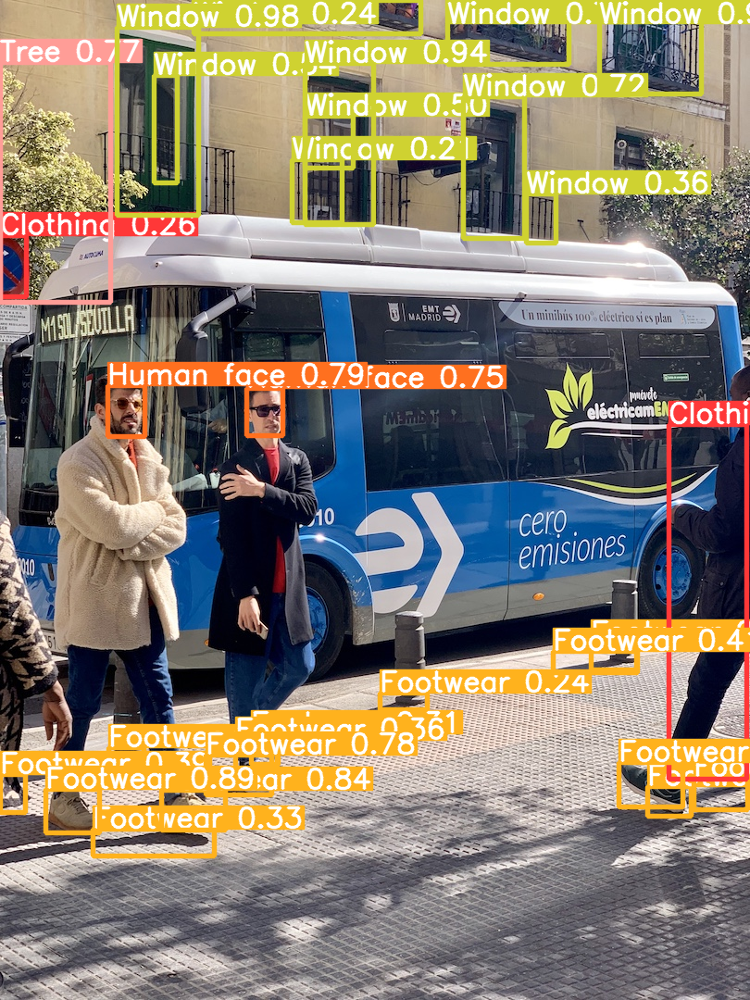

In [ ]:
# Inference
results = model.predict([im1, im2], imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[1].plot(probs=True, boxes=True))


0: 640x640 2 Persons, 1 Human face, 1 Fashion accessory, 1: 640x640 2 Clothings, 1 Person, 2 Trees, 2 Human faces, 2 Footwears, 32.6ms
Speed: 5.5ms preprocess, 16.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


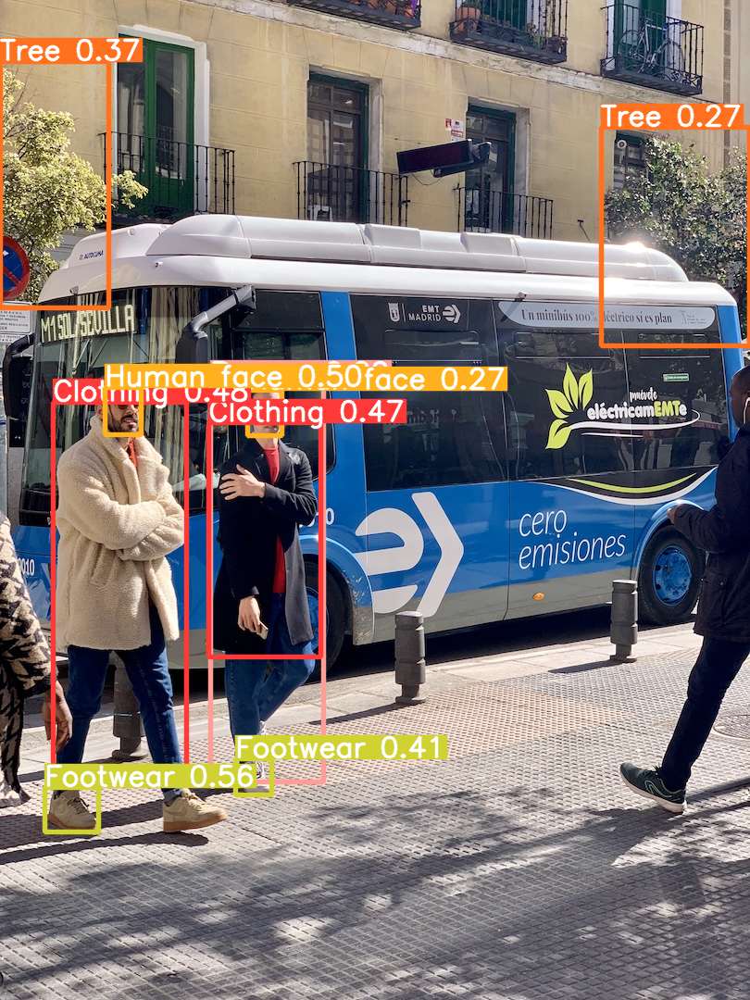

In [ ]:
# Inference
results = model.predict([im1, im2], imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[1].plot(probs=True, boxes=True))


image 1/1 /content/0.jpg: 640x640 2 Clothings, 1 Human face, 7 Windows, 1 Building, 25.9ms
Speed: 6.8ms preprocess, 25.9ms inference, 8.8ms postprocess per image at shape (1, 3, 640, 640)


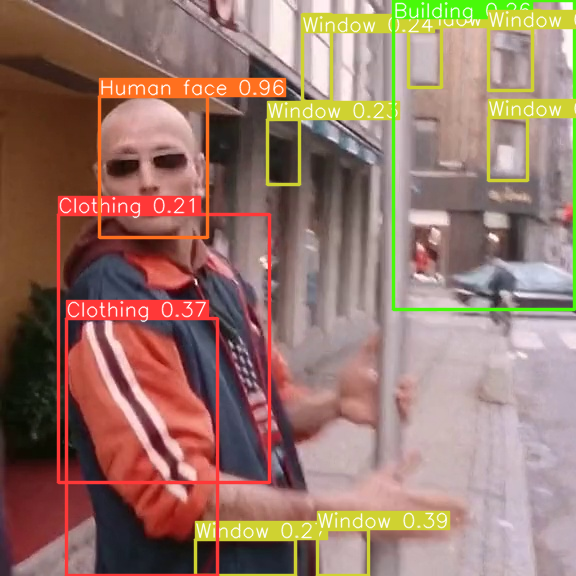

In [ ]:
# Inference
results = model.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.9) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))


image 1/1 /content/0.jpg: 640x640 2 Clothings, 1 Human face, 7 Windows, 1 Building, 16.5ms
Speed: 4.5ms preprocess, 16.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


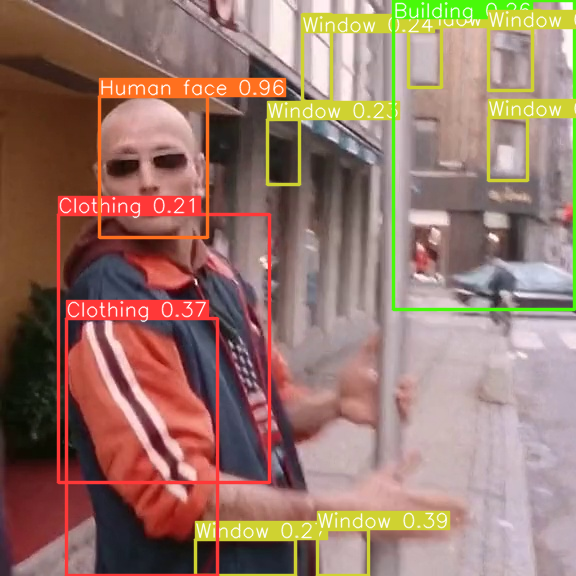

In [ ]:
# Inference
results = model.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.9) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))


image 1/1 /content/0.jpg: 640x640 1 Human face, 18.1ms
Speed: 4.5ms preprocess, 18.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


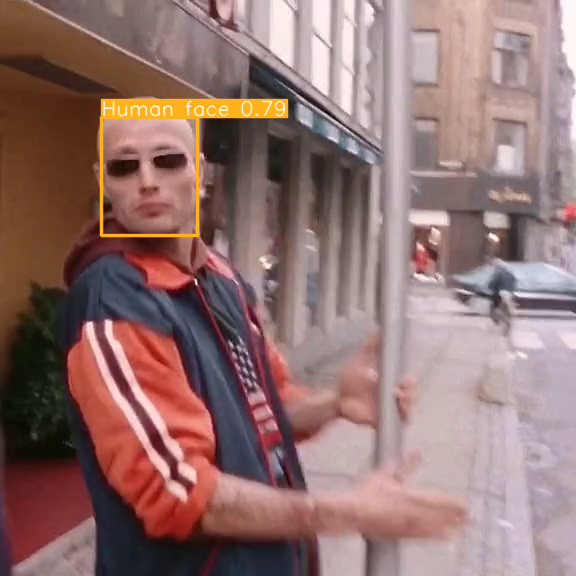

In [ ]:
# Inference
results = model.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))


0: 640x640 2 Persons, 1 Human face, 1 Fashion accessory, 1: 640x640 2 Clothings, 1 Person, 2 Trees, 2 Human faces, 2 Footwears, 51.3ms
Speed: 5.4ms preprocess, 25.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


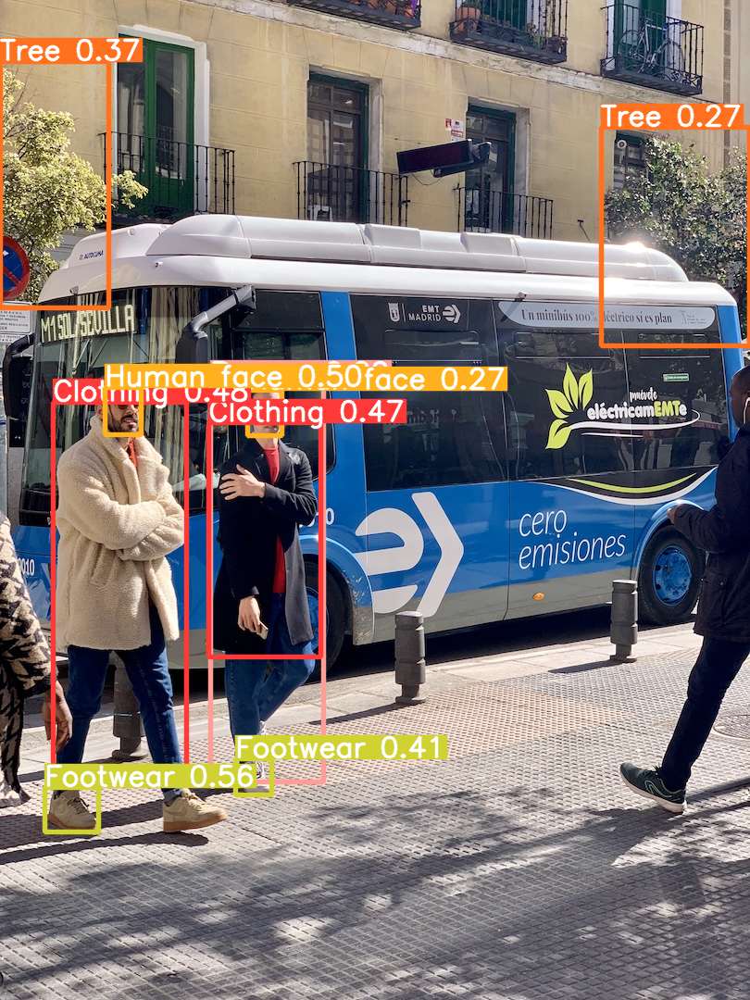

In [ ]:
# Inference
results = model.predict([im1, im2], imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[1].plot(probs=True, boxes=True))

## Test2


In [ ]:
from ultralytics import YOLO
# Load a model
model2 = YOLO('yolov8s.pt')  # load a pretrained model (recommended for training)

100%|██████████| 21.5M/21.5M [00:00<00:00, 160MB/s]


In [ ]:
train_yaml_path = dataset_dir + "/dataset.yaml"
model2.train(data=train_yaml_path, epochs=22, patience = 8, imgsz=32*15, batch = 80, cache = False, lr0 = 0.05, lrf = 0.02, box = 3.5, cls = 0.25, dfl = 0.75, pretrained = True, project = "diploma", name = "YOLOv8s_14cls", save_period = 4)

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/custom_cls/dataset.yaml, epochs=22, patience=8, batch=80, imgsz=480, save=True, save_period=2, cache=False, device=None, workers=8, project=diploma, name=YOLOv8s_14cls, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8

In [ ]:
model2.info()

Model summary: 225 layers, 11141018 parameters, 0 gradients


(225, 11141018, 0, 0.0)

In [ ]:
metrics = model2.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131002 parameters, 0 gradients
val: Scanning /content/custom_cls/labels/val.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:34<00:00,  2.65s/it]
                   all       1000       3710      0.317       0.27      0.229      0.139
              Clothing       1000       1010        0.4      0.329      0.275      0.154
                  Tree       1000        532      0.315      0.323      0.234      0.149
            Human face       1000        357      0.402        0.7      0.531      0.394
              Footwear       1000        594      0.345      0.431      0.293       0.12
                Window       1000        486      0.246     0.0617     0.0835     0.0392
              Building       1000  

0.2291803425382342

In [ ]:
dataset.apply_model(model2, label_field="predictions")

ValueError: ignored

## Test

In [ ]:
# Images
for f in 'zidane.jpg', 'bus.jpg':
    torch.hub.download_url_to_file('https://ultralytics.com/images/' + f, f)  # download 2 images
im1 = Image.open('zidane.jpg')  # PIL image
im2 = cv2.imread('bus.jpg')  # OpenCV image (BGR to RGB)

100%|██████████| 165k/165k [00:00<00:00, 7.77MB/s]
100%|██████████| 476k/476k [00:00<00:00, 12.1MB/s]



0: 640x640 2 Clothings, 2 Human faces, 1: 640x640 5 Footwears, 87.4ms
Speed: 2.7ms preprocess, 43.7ms inference, 8.7ms postprocess per image at shape (1, 3, 640, 640)


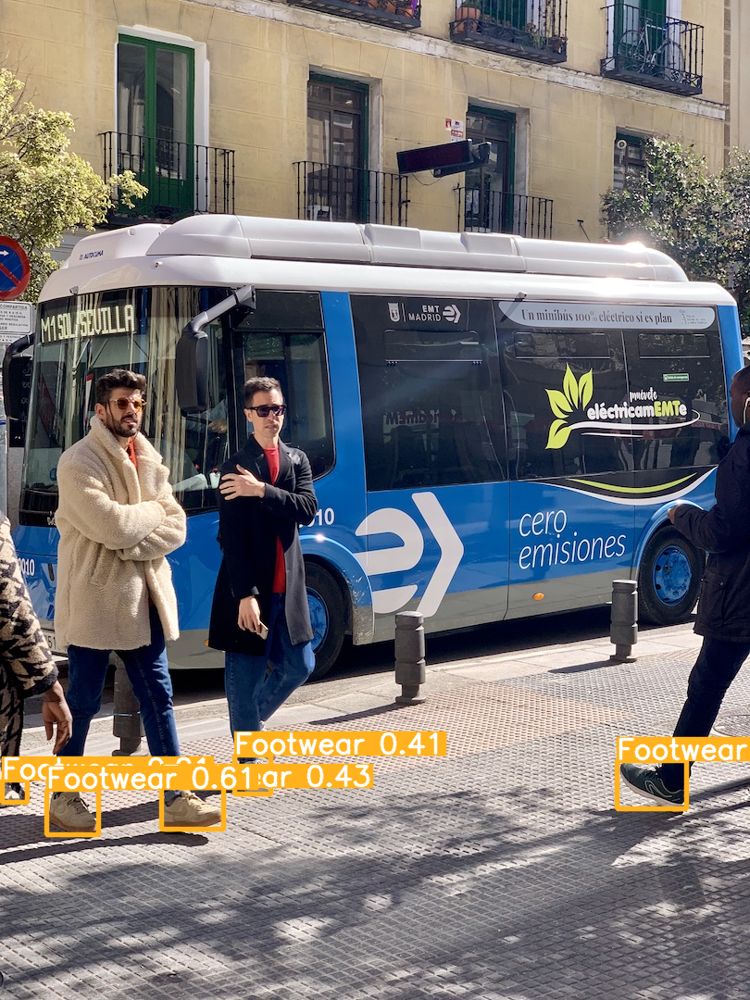

In [ ]:
# Inference
results = model2.predict([im1, im2], imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[1].plot(probs=True, boxes=True))


0: 640x640 2 Persons, 1 Human face, 1 Fashion accessory, 1: 640x640 2 Clothings, 1 Person, 2 Trees, 2 Human faces, 2 Footwears, 32.6ms
Speed: 5.5ms preprocess, 16.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


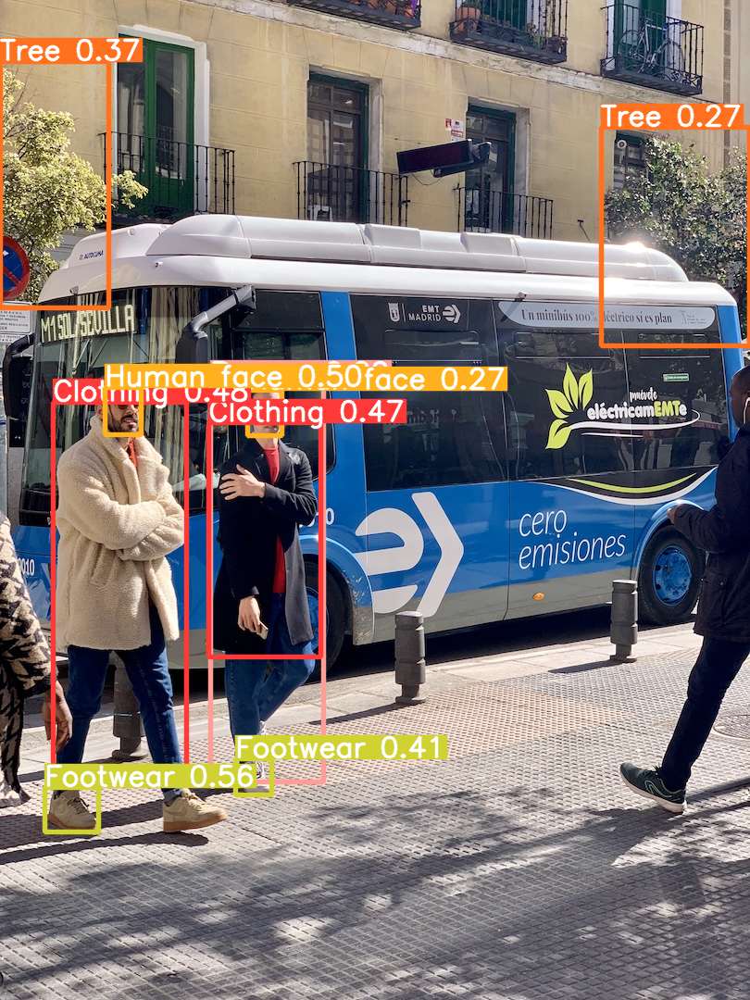

In [ ]:
# Inference
results = model.predict([im1, im2], imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[1].plot(probs=True, boxes=True))


image 1/1 /content/0.jpg: 640x640 2 Clothings, 1 Human face, 7 Windows, 1 Building, 25.9ms
Speed: 6.8ms preprocess, 25.9ms inference, 8.8ms postprocess per image at shape (1, 3, 640, 640)


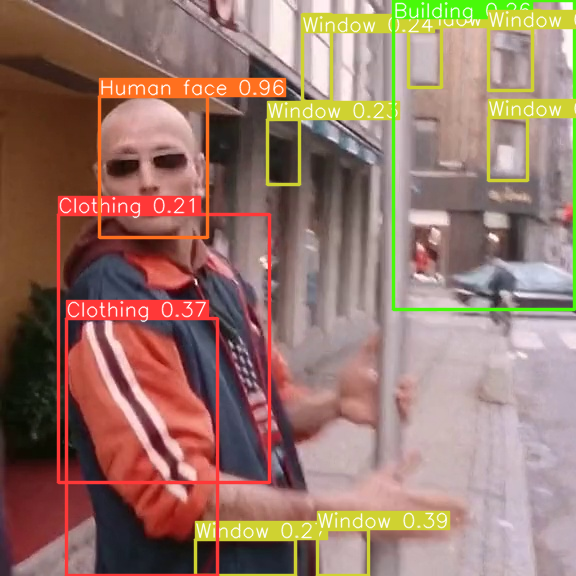

In [ ]:
# Inference
results = model.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.9) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))

In [ ]:
# Inference
results = model.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.9) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))

NameError: ignored


image 1/1 /content/0.jpg: 640x640 1 Human face, 25.7ms
Speed: 13.8ms preprocess, 25.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


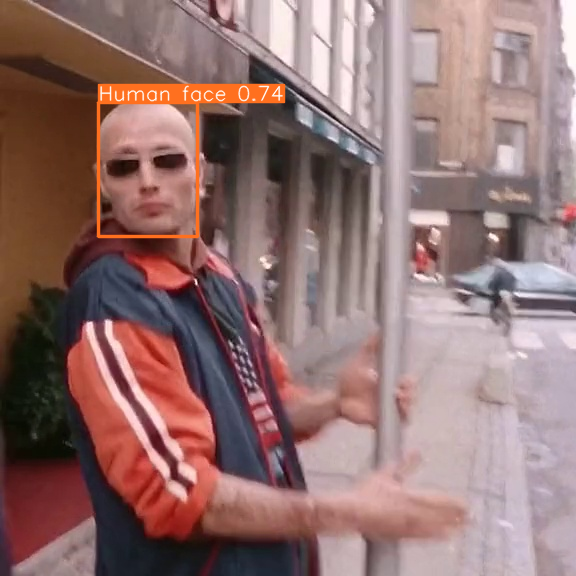

In [ ]:
# Inference
results = model2.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.9) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))


image 1/1 /content/0.jpg: 640x640 1 Human face, 18.1ms
Speed: 4.5ms preprocess, 18.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


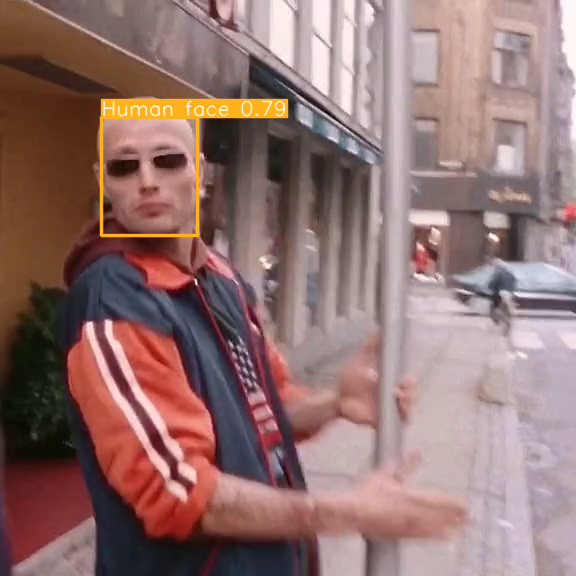

In [ ]:
# Inference
results = model.predict("/content/0.jpg", imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[0].plot(probs=True, boxes=True))


0: 640x640 2 Persons, 1 Human face, 1 Fashion accessory, 1: 640x640 2 Clothings, 1 Person, 2 Trees, 2 Human faces, 2 Footwears, 51.3ms
Speed: 5.4ms preprocess, 25.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


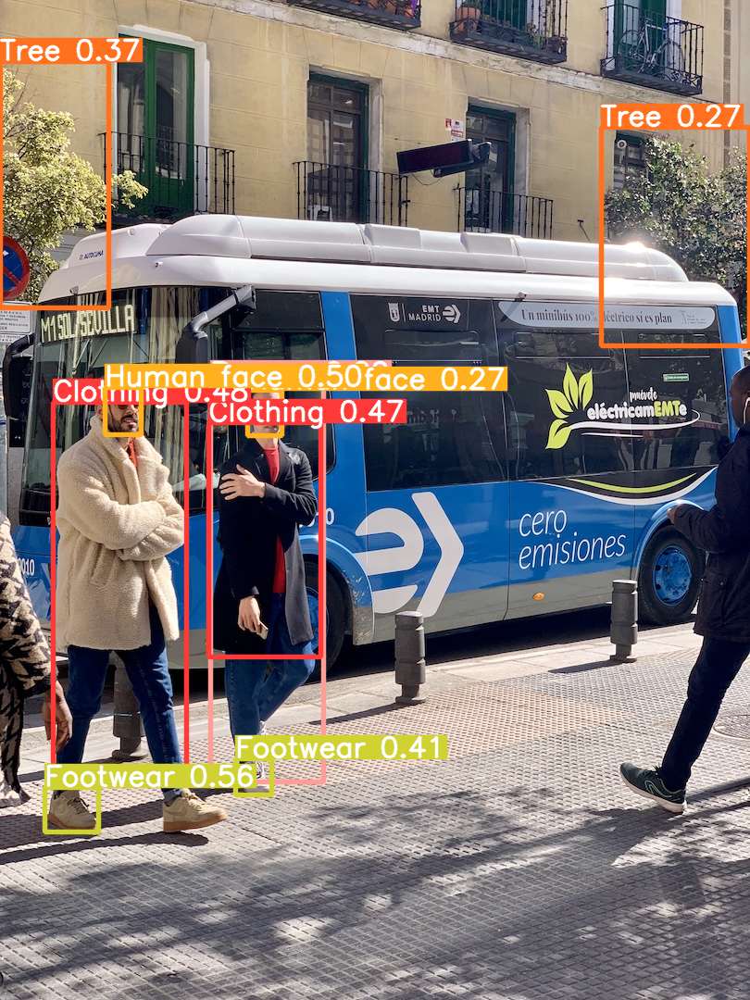

In [ ]:
# Inference
results = model.predict([im1, im2], imgsz=640, conf = 0.2, iou = 0.4) # batch of images

# Results
cv2_imshow(results[1].plot(probs=True, boxes=True))